# Taller 3

Integrantes:
- Daniela Martínez Quiroga
- María Isabella Rodríguez Arévalo

In [ ]:
#!kill -9 -1
!pip install -U ydata-profiling
!pip install gradio

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 25.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 33.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=e5d2f260959fe14cfc7825d7be54d13ae758d923007ce8aa091eb79bf183082d
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 MB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.1/322.1 kB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import sklearn
import pandas as pd
import matplotlib.pyplot as plt
import gradio as gr
import numpy as np

from sklearn.model_selection import train_test_split
from ydata_profiling import ProfileReport
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score

## 1er Punto: Precios del mercado accionario

### Reporte

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/oscar-bustos/javeriana-analitica/refs/heads/main/stockdata/AAPL.csv')
profile = ProfileReport(df, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Limpieza

No se lleva a cabo la limpieza de datos ya que no se encuentran datos perdidos o faltantes. De igual forma, los datos atípicos no se van a eliminar ya que los árboles de decisión no se ven afectados por ellos

### Organización de datos

In [ ]:
x = df.drop(['Daily_Return'], axis=1)
y = df['Daily_Return']

x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.3)

### Generación de los árboles

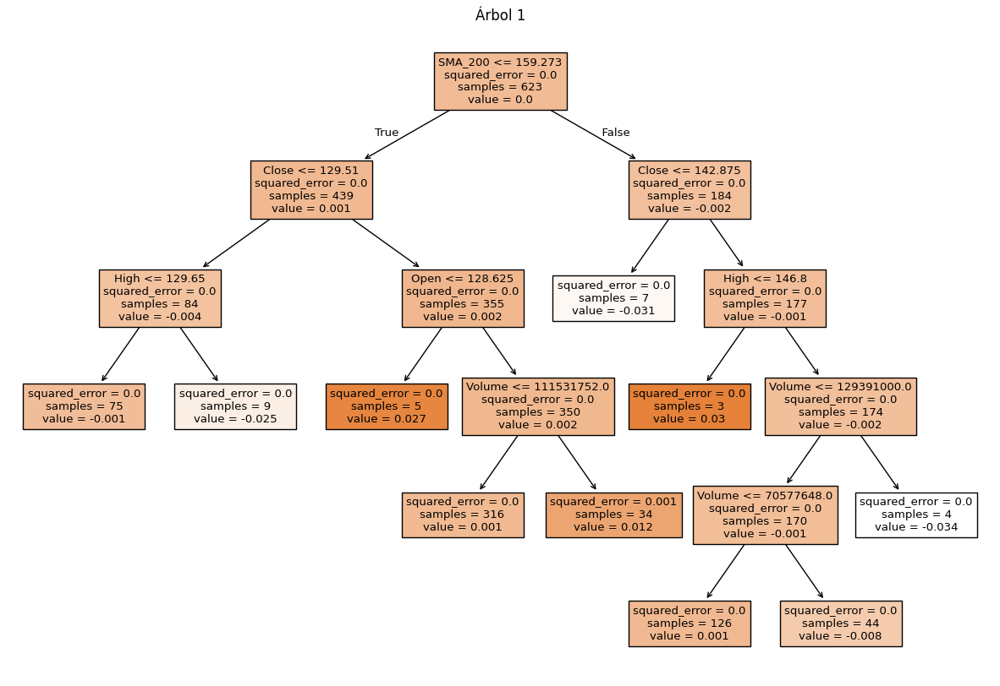

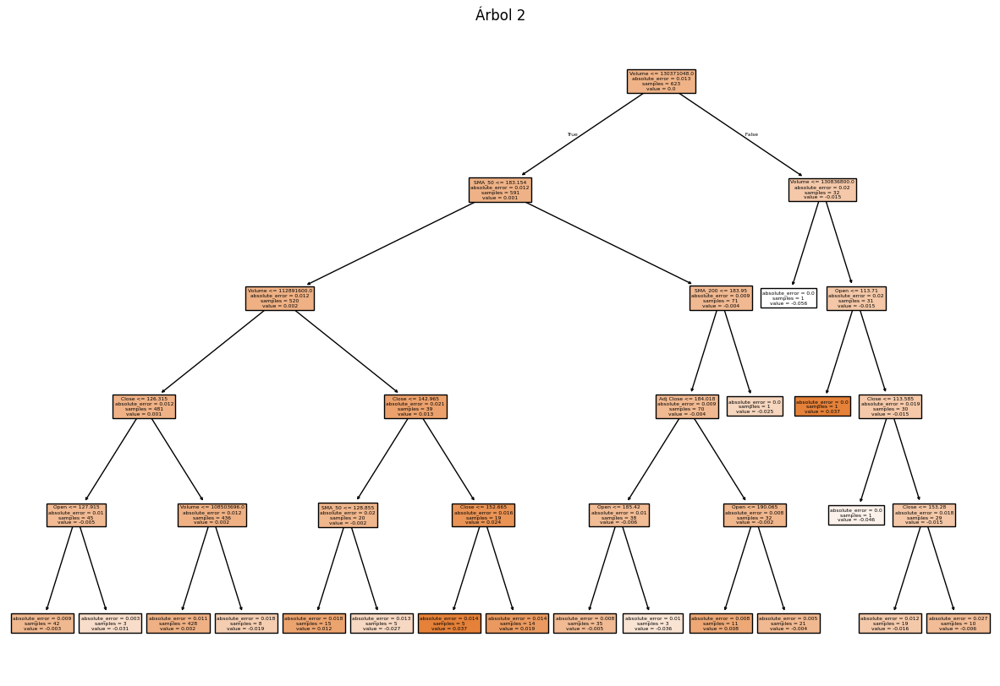

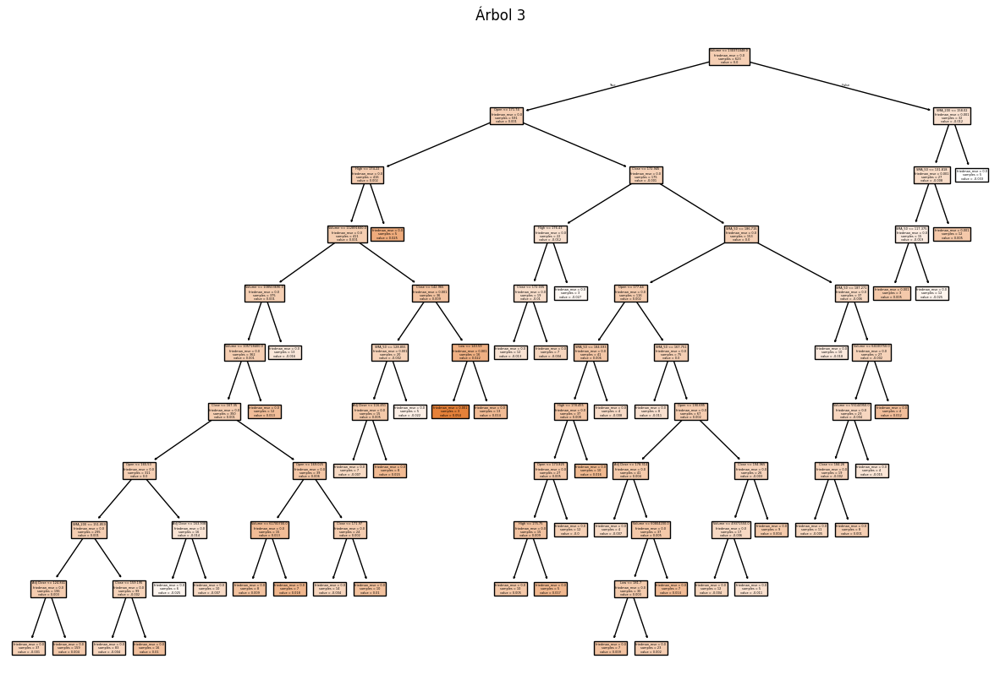

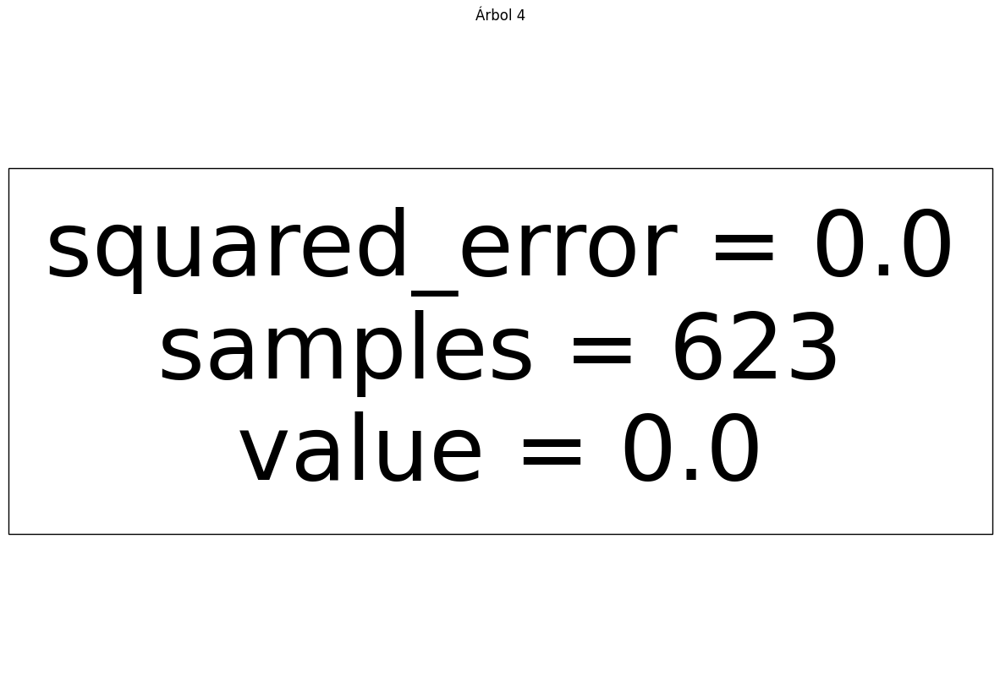

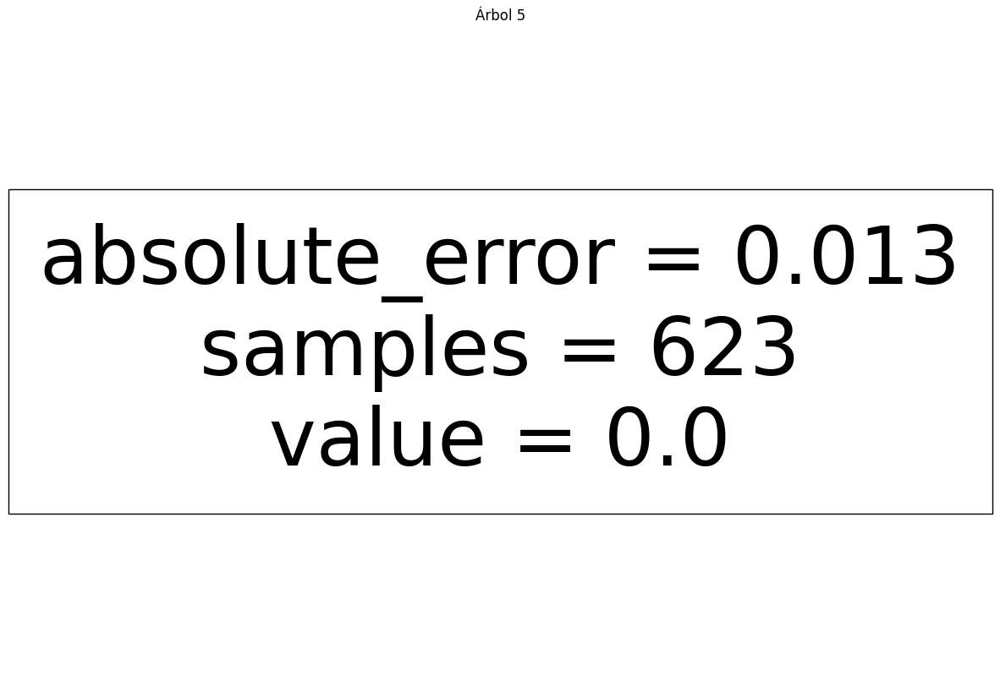

In [ ]:
arbol_op1 = DecisionTreeRegressor(criterion='squared_error', max_depth=15, max_features=0.4, max_leaf_nodes=10, min_impurity_decrease=0.0000001, min_samples_leaf=2, min_samples_split=30)
arbol_op2 = DecisionTreeRegressor(criterion='absolute_error', max_depth=5, max_features=0.5, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10)
arbol_op3 = DecisionTreeRegressor(criterion='friedman_mse', max_depth=10, max_features=0.7, max_leaf_nodes=None, min_impurity_decrease=0.000003, min_samples_leaf=3, min_samples_split=15)
arbol_op4 = DecisionTreeRegressor(criterion='squared_error', max_depth=None, max_features='sqrt', max_leaf_nodes=None, min_impurity_decrease=0.02, min_samples_leaf=1, min_samples_split=20)
arbol_op5 = DecisionTreeRegressor(criterion='absolute_error', max_depth=None, max_features='log2', max_leaf_nodes=9, min_impurity_decrease=0.015, min_samples_leaf=1, min_samples_split=25)

arbol_op1.fit(x_train, y_train)
arbol_op2.fit(x_train, y_train)
arbol_op3.fit(x_train, y_train)
arbol_op4.fit(x_train, y_train)
arbol_op5.fit(x_train, y_train)

y_pred1 = arbol_op1.predict(x_test)
y_pred2 = arbol_op2.predict(x_test)
y_pred3 = arbol_op3.predict(x_test)
y_pred4 = arbol_op4.predict(x_test)
y_pred5 = arbol_op5.predict(x_test)

plt.figure(figsize=(15, 10))
plot_tree(arbol_op1, filled=True, feature_names=x_train.columns)
plt.title("Árbol 1")
plt.show()

plt.figure(figsize=(15, 10))
plot_tree(arbol_op2, filled=True, feature_names=x_train.columns)
plt.title("Árbol 2")
plt.show()

plt.figure(figsize=(15, 10))
plot_tree(arbol_op3, filled=True, feature_names=x_train.columns)
plt.title("Árbol 3")
plt.show()

plt.figure(figsize=(15, 10))
plot_tree(arbol_op4, filled=True, feature_names=x_train.columns)
plt.title("Árbol 4")
plt.show()

plt.figure(figsize=(15, 10))
plot_tree(arbol_op5, filled=True, feature_names=x_train.columns)
plt.title("Árbol 5")
plt.show()


### Evaluación de los árboles

In [ ]:
#1ra opción de árbol
mse_op1 = mean_squared_error(y_test, y_pred1)
mae_op1 = mean_absolute_error(y_test, y_pred1)
r2_op1 = r2_score(y_test, y_pred1)
print("Error cuadrático medio del primer árbol:", mse_op1)
print("Error absoluto medio del primer árbol:", mae_op1)
print("Coeficiente de determinación del primer árbol:", r2_op1)
print()

#2da opción del árbol
mse_op2 = mean_squared_error(y_test, y_pred2)
mae_op2 = mean_absolute_error(y_test, y_pred2)
r2_op2 = r2_score(y_test, y_pred2)
print("Error cuadrático medio del segundo árbol:", mse_op2)
print("Error absoluto medio del segundo árbol:", mae_op2)
print("Coeficiente de determinación del segundo árbol:", r2_op2)
print()

#3ra opción del árbol
mse_op3 = mean_squared_error(y_test, y_pred3)
mae_op3 = mean_absolute_error(y_test, y_pred3)
r2_op3 = r2_score(y_test, y_pred3)
print("Error cuadrático medio del tercer árbol:", mse_op3)
print("Error absoluto medio del tercer árbol:", mae_op3)
print("Coeficiente de determinación del tercer árbol:", r2_op3)
print()

#4ta opción del árbol
mse_op4 = mean_squared_error(y_test, y_pred4)
mae_op4 = mean_absolute_error(y_test, y_pred4)
r2_op4 = r2_score(y_test, y_pred4)
print("Error cuadrático medio del cuarto árbol:", mse_op4)
print("Error absoluto medio del cuarto árbol:", mae_op4)
print("Coeficiente de determinación del cuarto árbol:", r2_op4)
print()

#5ta opción del árbol
mse_op5 = mean_squared_error(y_test, y_pred5)
mae_op5 = mean_absolute_error(y_test, y_pred5)
r2_op5 = r2_score(y_test, y_pred5)
print("Error cuadrático medio del quinto árbol:", mse_op5)
print("Error absoluto medio del quinto árbol:", mae_op5)
print("Coeficiente de determinación del quinto árbol:", r2_op5)
print()

Error cuadrático medio del primer árbol: 0.00034578175230277143
Error absoluto medio del primer árbol: 0.013886802695771557
Coeficiente de determinación del primer árbol: -0.05126850221616697

Error cuadrático medio del segundo árbol: 0.0004518727419861768
Error absoluto medio del segundo árbol: 0.014849751607001931
Coeficiente de determinación del segundo árbol: -0.3738133302192568

Error cuadrático medio del tercer árbol: 0.0004529762869794142
Error absoluto medio del tercer árbol: 0.015447108807375043
Coeficiente de determinación del tercer árbol: -0.37716840053295275

Error cuadrático medio del cuarto árbol: 0.00033059618246240673
Error absoluto medio del cuarto árbol: 0.013389102116886485
Coeficiente de determinación del cuarto árbol: -0.0051003306597894316

Error cuadrático medio del quinto árbol: 0.00032995935656759517
Error absoluto medio del quinto árbol: 0.013390132226587425
Coeficiente de determinación del quinto árbol: -0.0031642105489029237



### Conclusiones
- Como podemos observar, todos los árboles generaron errores cuadrático cercano a cero indicando que sus predicciones son precisas. Para el error absoluto, el resultado fue cercano a cero pero no tanto como el cuadrático. Teniendo en cuenta los árboles generados, el árbol #4 es quién da mejores predicciones al ser sus errores los más cercanos a cero
- Para el coeficiente de determinación, al ser todos menores que cero, indican que los modelos no son los mejores. sin embargo los modelos 4 y 5 están cercanos a cero, lo que indica que se deberían usar esos dos
- El parámetro min_impurity_decrease es el más influyente a la hora de generar árboles. En el caso del 4to y 5to árbol al tener ese parámetro distante al cero, hace que el árbol sea extenso y complejo de diagramar

## 2do Punto: árbol de decisión dataset titanic

### Limpieza de datos

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/datasciencedojo/datasets/refs/heads/master/titanic.csv')

# Sólo variables de tipo numérico
df_limpio = df[['Survived', 'Pclass', 'Age', 'SibSp', 'Parch', 'Fare']]

df_limpio = df_limpio.dropna()

df_limpio

,Survived,Pclass,Age,SibSp,Parch,Fare
0,0,3,22.0,1,0,7.2500
1,1,1,38.0,1,0,71.2833
2,1,3,26.0,0,0,7.9250
3,1,1,35.0,1,0,53.1000
4,0,3,35.0,0,0,8.0500
...,...,...,...,...,...,...
885,0,3,39.0,0,5,29.1250
886,0,2,27.0,0,0,13.0000
887,1,1,19.0,0,0,30.0000
889,1,1,26.0,0,0,30.0000


### Organización de los datos

In [ ]:
x_titanic = df_limpio.drop(['Survived'], axis=1)
y_titanic = df_limpio['Survived']

X_train_titanic, X_test_titanic, y_train_titanic, y_test_titanic = train_test_split(x_titanic, y_titanic, test_size=0.3, random_state=42)

### Generación y evaluación de los árboles
Para obtener un modelo con error mínimo se establecieron posibles valores de los hiperparámetros y se probaron todos para obtener el mejor. Si bien esta práctica no es buena con datasets o conjuntos de hiperparámetrosmuy grendes, en este caso funciona, y el mejor árbol tiene los siguientes hiperparámetros:

- criterion': 'squared_error'
- 'max_depth': 5
- 'max_features': 'log2'
- 'min_impurity_decrease': 3e-06
- 'min_samples_leaf': 2
- 'min_samples_split': 20



In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor

# Hiperparámetros y sus posibles valores
param_grid = {
    'criterion': ['squared_error'],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 10, 20],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
    'min_impurity_decrease': [0.0, 0.000003, 0.015]
}

# Crear un objeto GridSearchCV
grid_search = GridSearchCV(DecisionTreeRegressor(), param_grid, cv=5, scoring='neg_mean_squared_error')

# Ajustar el modelo a los datos de entrenamiento
grid_search.fit(X_train_titanic, y_train_titanic)

# Mejores hiperparámetros
print("Mejores hiperparámetros:", grid_search.best_params_)

# Mejor modelo
best_tree = grid_search.best_estimator_

Mejores hiperparámetros: {'criterion': 'squared_error', 'max_depth': 10, 'max_features': 'log2', 'min_impurity_decrease': 3e-06, 'min_samples_leaf': 2, 'min_samples_split': 10}


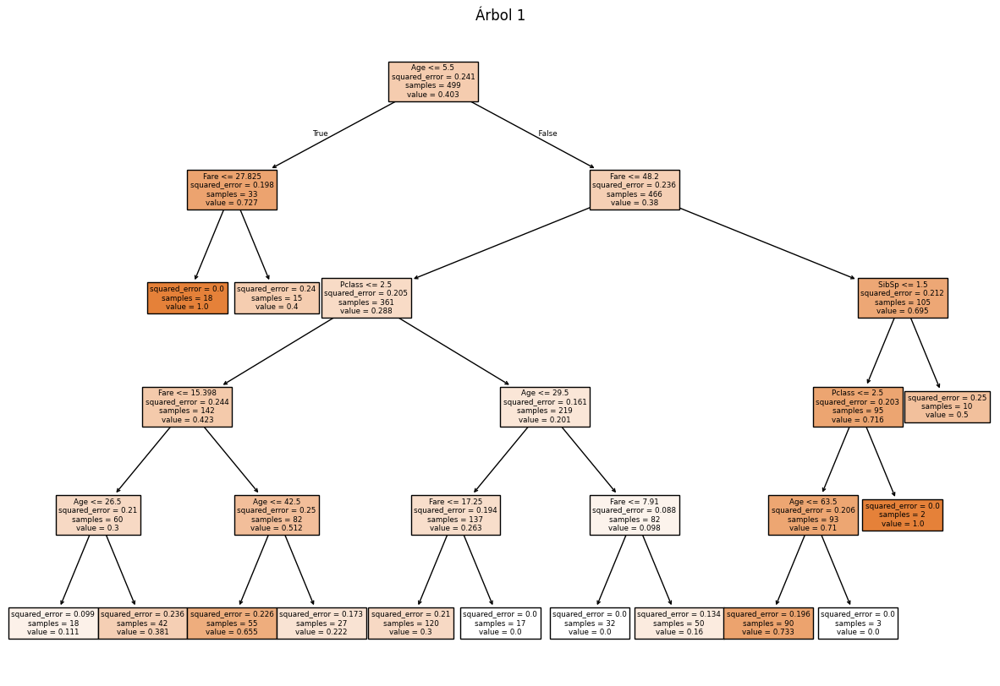

Error cuadrático medio del primer árbol: 0.23250868456174403
Error absoluto medio del primer árbol: 0.3934153495083727
Coeficiente de determinación del primer árbol: 0.04158070769871447


NameError: name 'acc_op1' is not defined

In [ ]:
arbol_t1 = DecisionTreeRegressor(criterion='squared_error', max_depth=5, max_features='log2', max_leaf_nodes=None, min_impurity_decrease=0.000003, min_samples_leaf=2, min_samples_split=20)
arbol_t1.fit(X_train_titanic, y_train_titanic)
y_titanic_p1 = arbol_t1.predict(X_test_titanic)

plt.figure(figsize=(15, 10))

plot_tree(arbol_t1, filled=True, feature_names=X_train_titanic.columns)

plt.title("Árbol 1")
plt.show()

mse_op1 = mean_squared_error(y_test_titanic, y_titanic_p1)
mae_op1 = mean_absolute_error(y_test_titanic, y_titanic_p1)
r2_op1 = r2_score(y_test_titanic, y_titanic_p1)
print("Error cuadrático medio del primer árbol:", mse_op1)
print("Error absoluto medio del primer árbol:", mae_op1)
print("Coeficiente de determinación del primer árbol:", r2_op1)
print("Accuracy del primer árbol:", acc_op1)
print()


# Redondear las predicciones
y_titanic_p1_round = y_titanic_p1.round()
acc_op1 = accuracy_score(y_test_titanic, y_titanic_p1_round)

print("Accuracy del primer árbol (redondeado):", acc_op1)

### Interfaz con Gradio

In [ ]:
def predecir(pclass, age, sibsp, parch, fare):
  input_array = np.array([[pclass, age, sibsp, parch, fare]])
  result = arbol_t1.predict(input_array)
  return f"Probabilidad de sobrevivir: {result[0]:.2f}"


with gr.Blocks(css=".gradio-container {background-color: #f99abc;}") as interfaz:
  gr.Markdown("<h1 style='text-align: center; color: #d63384;'> Probabilidad de supervivencia en el Titanic </h1>")

  with gr.Column():
    with gr.Row():
      input_1 = gr.Dropdown([1, 2, 3], label="Pclass")  # Dropdown for Pclass
      input_2 = gr.Number(label="Edad")
    with gr.Row():
      input_3 = gr.Number(label="Número de hermanos abordo (SibSp)")
      input_4 = gr.Slider(0, 5, step=1, label="Número de familiares abordo (Parch)")  # Slider for Parch
    with gr.Row():  # New row for Fare
      input_5 = gr.Number(label="Tarifa del billete (Fare)")

    btn = gr.Button("Predecir")

    output = gr.Textbox(label="Sobrevive o no")

  btn.click(fn=predecir, inputs=[input_1, input_2, input_3, input_4, input_5], outputs=output)


if __name__ == "__main__":
  interfaz.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://61993c3ac7020df6d0.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


### Conclusiones y comparación con regresor logístico

El regresor logítico presentó las siguientes características:

- Precisión del modelo: 0.8
- Exactitud del modelo: 0.7052238805970149
- Recall del modelo: 0.3106796116504854
- F1-score del modelo: 0.44755244755244755

Para el árbol obtenido, el regresor logístico tiene un mejor desempeño, ya que alcanza una precisión del 80%, respecto al coeficiente de determinación de 0.096 del árbol. Las razones podrían ser que el árbol es más propenso a sobreajustes, a pesar de uqe se intentó establecer los mejores hiperparámetros.